In [2]:
from __future__ import absolute_import, division, print_function, unicode_literals

%load_ext autoreload
%autoreload 2

import numpy as np
import scipy as sp
import matplotlib.pyplot as plt
import matplotlib as mpl
import pandas as pd
%matplotlib inline
%config InlineBackend.figure_format = 'retina'  # adapt plots for retina displays

from IPython.core.debugger import set_trace

In [3]:
import os
import utils
from tqdm import tqdm_notebook
from sklearn.model_selection import train_test_split
import multiprocessing
import json

In [4]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.autograd import Variable
from torch.utils.data import Dataset, DataLoader

In [5]:
import datasets, models, interpretation

/analysis/share/johannesr/torchsample/torchsample/modules/_utils.py:8: UserWarning: inspect.signature not available... you should upgrade to Python 3.x
  warnings.warn('inspect.signature not available... '


# Load model, dataset and brain area masks

In [49]:
net = models.ClassificationModel3D()
net.load_state_dict(torch.load('data/models/softmax-output_state-dict.pt'))

In [50]:
if torch.cuda.is_available():
    net.cuda()
    cuda_device = torch.cuda.current_device()
    print('Moved network to GPU')
else:
    cuda_device = -1
    print('GPU not available')

Moved network to GPU


In [52]:
# Important: Set model to eval before using any interpretation methods
net.eval();

In [8]:
# TODO: Move the stuff below to an extra method and integrate it with the code in training.ipynb.

In [9]:
# Load the data table with all 1.5 Tesla MRI scans from ADNI.
df = datasets.load_data_table_15T()

Loading dataframe for /analysis/share/ADNI/ADNI_tables/customized/DxByImgClean_CompleteAnnual2YearVisitList_1_5T.csv
Found 1590 images in table
Filtered out 2 of 1590 images because of failed preprocessing
Filtered out 0 of 1588 images because of missing files
Filtered out 619 of 1588 images that were MCI
Final dataframe contains 969 images from 344 patients



In [10]:
# Patient-wise train-test-split.
# Select a number of patients for each class, put all their images in the test set 
# and all other images in the train set. This is the split that is used in the paper to produce the heatmaps.
test_patients_per_class = 30

patients_AD = df[df['DX'] == 'Dementia']['PTID'].unique()
patients_CN = df[df['DX'] == 'CN']['PTID'].unique()
patients_CN = filter(lambda p: p not in patients_AD, patients_CN)  # patients that have both a CN and an AD scan should belong to the AD group

patients_AD_train, patients_AD_test = train_test_split(patients_AD, test_size=test_patients_per_class, random_state=0)
patients_CN_train, patients_CN_test = train_test_split(patients_CN, test_size=test_patients_per_class, random_state=0)

patients_train = np.concatenate([patients_AD_train, patients_CN_train])
patients_test = np.concatenate([patients_AD_test, patients_CN_test])

In [11]:
train_dataset, test_dataset = datasets.build_datasets(df, patients_train, patients_test, normalize=True)

         Images    -> AD    -> CN    Patients    -> AD    -> CN
-----  --------  -------  -------  ----------  -------  -------
All         969      475      494         344      193      151
Train       794      399      395         284      163      121
Val         175       76       99          60       30       30

Calculating mean and std for normalization:


A Jupyter Widget

In [12]:
# Set up a binary mask for each brain area based on the AAL atlas.
# This is required for brain area occlusion and to determine the relevance per area.
# The AAL atlas can for example be retrieved from here: https://github.com/neurolabusc/MRIcron/blob/master/templates/aal.nii.gz
brain_map = utils.load_nifti('data/brain-maps/aal.nii.gz')
brain_areas = np.unique(brain_map)[1:]  # omit background

area_masks = []
for area in tqdm_notebook(brain_areas):
    area_mask = np.zeros_like(brain_map)
    area_mask[brain_map == area] = 1
    area_mask = utils.resize_image(area_mask, test_dataset.image_shape(), interpolation=0)
    area_masks.append(area_mask)

area_names = ['Precentral_L', 'Precentral_R', 'Frontal_Sup_L', 'Frontal_Sup_R', 'Frontal_Sup_Orb_L', 'Frontal_Sup_Orb_R', 'Frontal_Mid_L', 'Frontal_Mid_R', 'Frontal_Mid_Orb_L', 'Frontal_Mid_Orb_R', 'Frontal_Inf_Oper_L', 'Frontal_Inf_Oper_R', 'Frontal_Inf_Tri_L', 'Frontal_Inf_Tri_R', 'Frontal_Inf_Orb_L', 'Frontal_Inf_Orb_R', 'Rolandic_Oper_L', 'Rolandic_Oper_R', 'Supp_Motor_Area_L', 'Supp_Motor_Area_R', 'Olfactory_L', 'Olfactory_R', 'Frontal_Sup_Medial_L', 'Frontal_Sup_Medial_R', 'Frontal_Med_Orb_L', 'Frontal_Med_Orb_R', 'Rectus_L', 'Rectus_R', 'Insula_L', 'Insula_R', 'Cingulum_Ant_L', 'Cingulum_Ant_R', 'Cingulum_Mid_L', 'Cingulum_Mid_R', 'Cingulum_Post_L', 'Cingulum_Post_R', 'Hippocampus_L', 'Hippocampus_R', 'ParaHippocampal_L', 'ParaHippocampal_R', 'Amygdala_L', 'Amygdala_R', 'Calcarine_L', 'Calcarine_R', 'Cuneus_L', 'Cuneus_R', 'Lingual_L', 'Lingual_R', 'Occipital_Sup_L', 'Occipital_Sup_R', 'Occipital_Mid_L', 'Occipital_Mid_R', 'Occipital_Inf_L', 'Occipital_Inf_R', 'Fusiform_L', 'Fusiform_R', 'Postcentral_L', 'Postcentral_R', 'Parietal_Sup_L', 'Parietal_Sup_R', 'Parietal_Inf_L', 'Parietal_Inf_R', 'SupraMarginal_L', 'SupraMarginal_R', 'Angular_L', 'Angular_R', 'Precuneus_L', 'Precuneus_R', 'Paracentral_Lobule_L', 'Paracentral_Lobule_R', 'Caudate_L', 'Caudate_R', 'Putamen_L', 'Putamen_R', 'Pallidum_L', 'Pallidum_R', 'Thalamus_L', 'Thalamus_R', 'Heschl_L', 'Heschl_R', 'Temporal_Sup_L', 'Temporal_Sup_R', 'Temporal_Pole_Sup_L', 'Temporal_Pole_Sup_R', 'Temporal_Mid_L', 'Temporal_Mid_R', 'Temporal_Pole_Mid_L', 'Temporal_Pole_Mid_R', 'Temporal_Inf_L', 'Temporal_Inf_R', 'Cerebelum_Crus1_L', 'Cerebelum_Crus1_R', 'Cerebelum_Crus2_L', 'Cerebelum_Crus2_R', 'Cerebelum_3_L', 'Cerebelum_3_R', 'Cerebelum_4_5_L', 'Cerebelum_4_5_R', 'Cerebelum_6_L', 'Cerebelum_6_R', 'Cerebelum_7b_L', 'Cerebelum_7b_R', 'Cerebelum_8_L', 'Cerebelum_8_R', 'Cerebelum_9_L', 'Cerebelum_9_R', 'Cerebelum_10_L', 'Cerebelum_10_R', 'Vermis_1_2', 'Vermis_3', 'Vermis_4_5', 'Vermis_6', 'Vermis_7', 'Vermis_8', 'Vermis_9', 'Vermis_10']

# Merge left and right areas.
merged_area_names = [name[:-2] for name in area_names[:108:2]] + area_names[108:]

A Jupyter Widget

In [14]:
def get_relevance_per_area(relevance_map, normalize=True):
    relevances = np.zeros(len(area_masks))
    for i, area_mask in enumerate(area_masks):
        relevances[i] = np.sum(relevance_map * area_mask)
    if normalize:
        relevances /= relevances.sum()  # make all areas sum to 1

    # Merge left and right areas.
    merged_relevances = np.concatenate([relevances[:108].reshape(-1, 2).sum(1), relevances[108:]])

    return sorted(zip(merged_area_names, merged_relevances), key=lambda (a, b): b, reverse=True)

# Relevance heatmaps for single images

## Raw image

0.0 683.786425468 None None


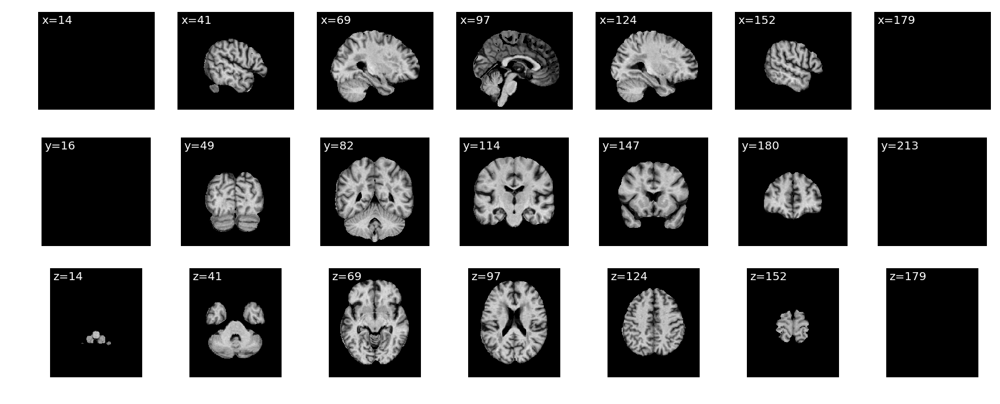

In [68]:
which = 1

image_tensor = test_dataset[which][0]
raw_image = test_dataset.get_raw_image(which)

utils.plot_slices(raw_image, num_slices=7)

## Sensitivity Analysis

In [72]:
relevance_map_backprop = interpretation.sensitivity_analysis(net, image_tensor, cuda=True, verbose=True)

Image was classified as 1 with probability 0.701093912125


0.0 683.786425468 0.0 0.00155293438351


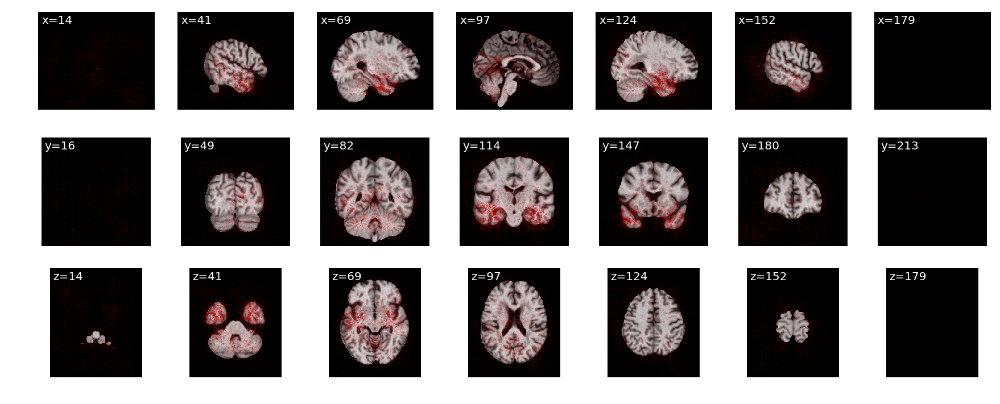

In [73]:
utils.plot_slices(raw_image, overlay=relevance_map_backprop[0], overlay_vmax=np.percentile(relevance_map_backprop, 99.9), overlay_cmap=utils.alpha_to_red_cmap)

In [74]:
get_relevance_per_area(relevance_map_backprop[0])[:10]

[(u'Temporal_Mid', 0.064770249784479997),
 (u'Temporal_Inf', 0.061069535810060395),
 (u'Fusiform', 0.045201906501014293),
 (u'Frontal_Mid', 0.032206588950420986),
 (u'Insula', 0.030571985626311273),
 (u'Temporal_Sup', 0.030109531301326271),
 (u'Hippocampus', 0.029775883323791892),
 (u'ParaHippocampal', 0.02958626013541827),
 (u'Lingual', 0.029523501898919335),
 (u'Calcarine', 0.029407399641939762)]

## Guided Backpropagation

In [75]:
relevance_map_guided = interpretation.guided_backprop(net, image_tensor, cuda=True, verbose=True)

Registered hook for layer: ReLU()
Image was classified as 1 with probability 0.701093912125
Removing 1 hook(s)


0.0 683.786425468 0.0 0.000288108755485


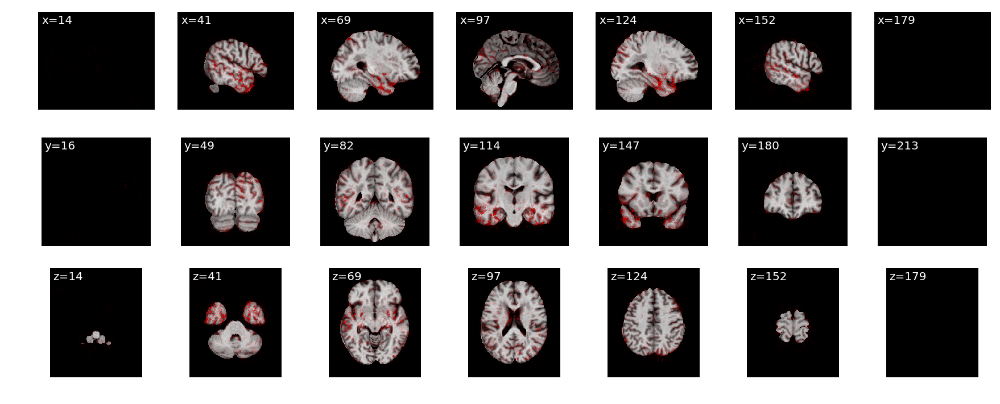

In [76]:
utils.plot_slices(raw_image, overlay=relevance_map_guided[0], overlay_vmax=np.percentile(relevance_map_guided, 99.9))

In [77]:
get_relevance_per_area(relevance_map_guided[0])[:10]

[(u'Temporal_Mid', 0.088080559000103364),
 (u'Temporal_Inf', 0.064285278043361538),
 (u'Insula', 0.04415289711110016),
 (u'Temporal_Sup', 0.040392377015045167),
 (u'Fusiform', 0.036730410797019927),
 (u'Hippocampus', 0.036451400202888222),
 (u'Frontal_Mid', 0.034540666431035996),
 (u'ParaHippocampal', 0.031467028669954142),
 (u'Occipital_Mid', 0.030926939052097965),
 (u'Precuneus', 0.029053778557734132)]

## Occlusion

In [78]:
relevance_map_occlusion = interpretation.occlusion(net, image_tensor, size=40, stride=25, cuda=True, resize=True, verbose=True)

Image was classified as 1 with probability 0.70109385252


A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

0.0 683.786425468 0.0 0.254505634308


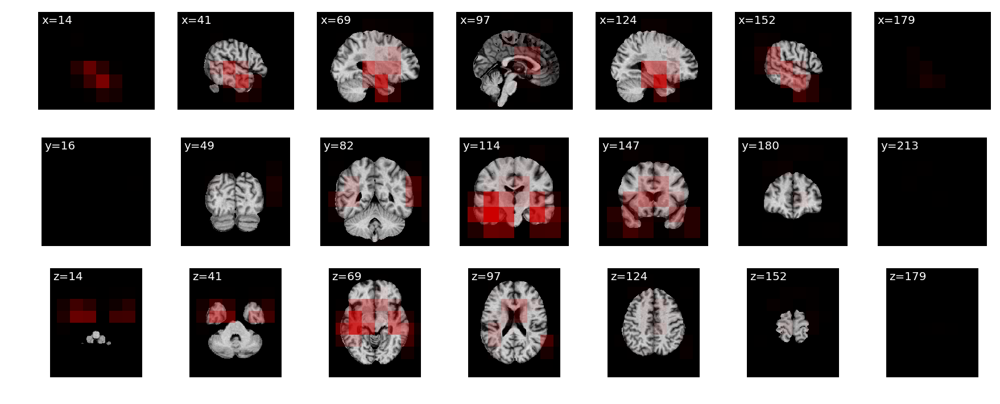

In [79]:
utils.plot_slices(raw_image, overlay=relevance_map_occlusion, overlay_cmap=utils.alpha_to_red_cmap)

In [80]:
get_relevance_per_area(relevance_map_occlusion)[:10]

[(u'Temporal_Mid', 0.15915635872655409),
 (u'Temporal_Sup', 0.10666407294719987),
 (u'Temporal_Inf', 0.092771682642036002),
 (u'Insula', 0.074364464882652345),
 (u'Hippocampus', 0.053020467567494789),
 (u'Fusiform', 0.050795734078401551),
 (u'Putamen', 0.0437495260881283),
 (u'Temporal_Pole_Sup', 0.040877495182112443),
 (u'ParaHippocampal', 0.03904754652244978),
 (u'Rolandic_Oper', 0.033560609453986652)]

(-0.5, 192.5, 192.5, -0.5)

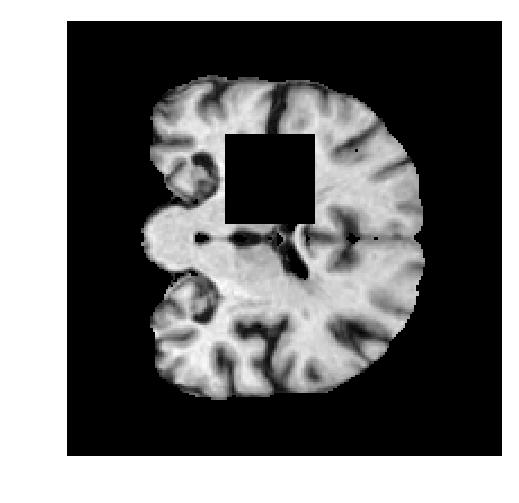

In [81]:
# Plot occlusion patch on image.
occluded_image = raw_image[:, 114, :].copy()
size = 40
occluded_image[50:50+size, 70:70+size] = 0
plt.imshow(occluded_image, cmap='gray')
plt.axis('off')

## Area Occlusion

In [82]:
relevance_map_area_occlusion = interpretation.area_occlusion(net, image_tensor, area_masks, cuda=True, verbose=True)

Image was classified as 1 with probability 0.701093912125


A Jupyter Widget

0.0 683.786425468 0.0 0.127922


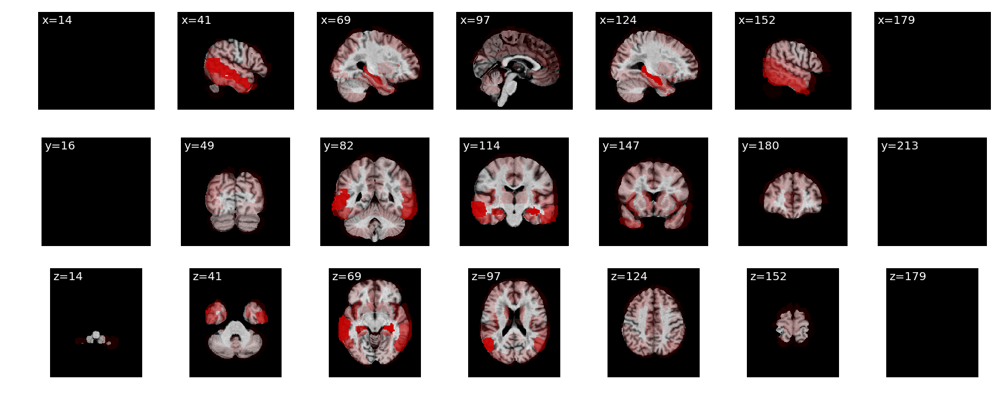

In [83]:
utils.plot_slices(raw_image, overlay=relevance_map_area_occlusion, overlay_cmap=utils.alpha_to_red_cmap)#, overlay_vmin=0, overlay_vmax=1)

In [84]:
get_relevance_per_area(relevance_map_area_occlusion)[:10]

[(u'Temporal_Mid', 0.18701904146576281),
 (u'Temporal_Inf', 0.1094148196805097),
 (u'Frontal_Mid', 0.04396956455215853),
 (u'Hippocampus', 0.043288559185914566),
 (u'Insula', 0.038048175715444665),
 (u'Temporal_Sup', 0.037299341388706407),
 (u'Frontal_Sup', 0.03162591815878351),
 (u'Occipital_Mid', 0.029652706421492259),
 (u'ParaHippocampal', 0.02363785489200395),
 (u'Frontal_Sup_Medial', 0.021620795893707127)]

## Grad-CAM
Note: Grad-CAM doesn't work on this data. It's only included here for completeness, but I couldn't figure out if there's a bug in the implementation or if the method is not applicable to this kind of data and/or model.

In [91]:
# TODO: Something is apparently wrong with gradcam, try to fix it. Could also simply be because feature maps of last layer are just 4x5x4, so very small.

In [92]:
relevance_map_grad_cam = interpretation.grad_cam(net, image_tensor, cuda=True, resize=True, interpolation=0, verbose=True)

Found last conv layer: Conv3d(32, 64, kernel_size=(3, 3, 3), stride=(1, 1, 1))
Stored feature maps
Image was classified as 1 with probability 0.701094

 0  1
[torch.cuda.FloatTensor of size 1x2 (GPU 0)]

Stored gradient
-0.000134394 4.73386e-06 8.18674e-05
(64, 1, 1, 1)
(64, 12, 15, 12)
(12, 15, 12)
0.000190107 0.000500659 0.000917184
0.000190107 0.000500659 0.000917184


0.0 683.786425468 0.0 549.674689844


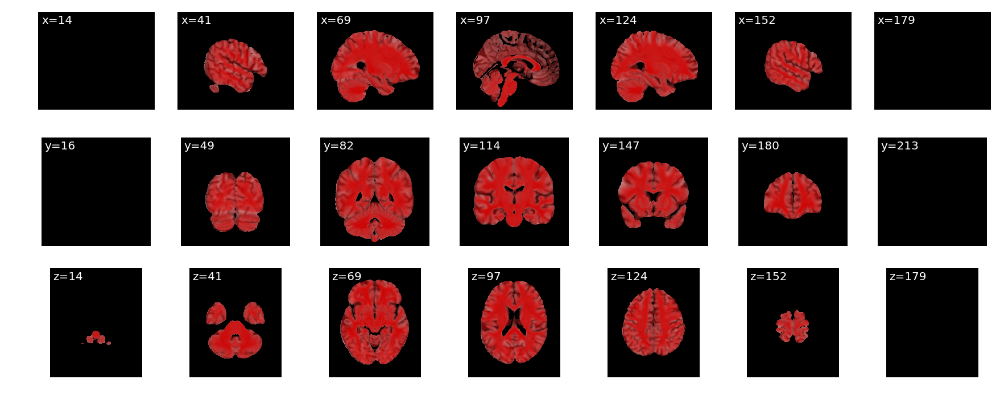

In [93]:
utils.plot_slices(raw_image, overlay=relevance_map_grad_cam * test_dataset.std + test_dataset.mean)

0.0 683.786425468 0.000190107 0.000917184


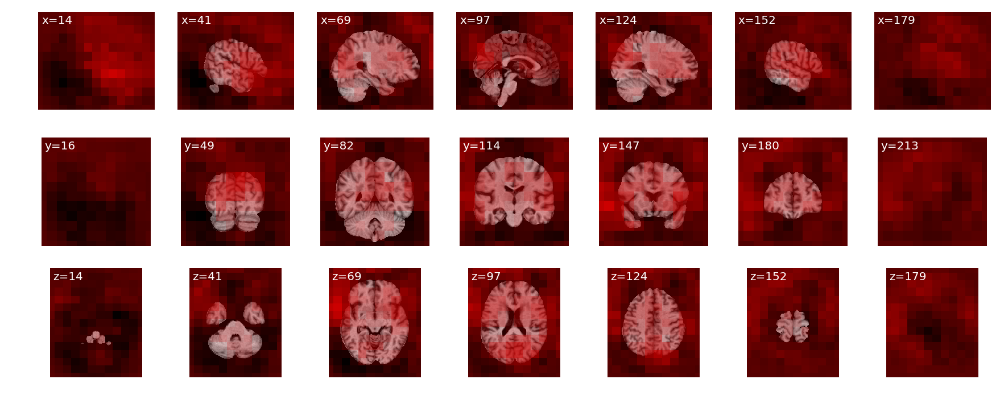

In [94]:
utils.plot_slices(raw_image, overlay=relevance_map_grad_cam)

0.000190107 0.000917184 None None


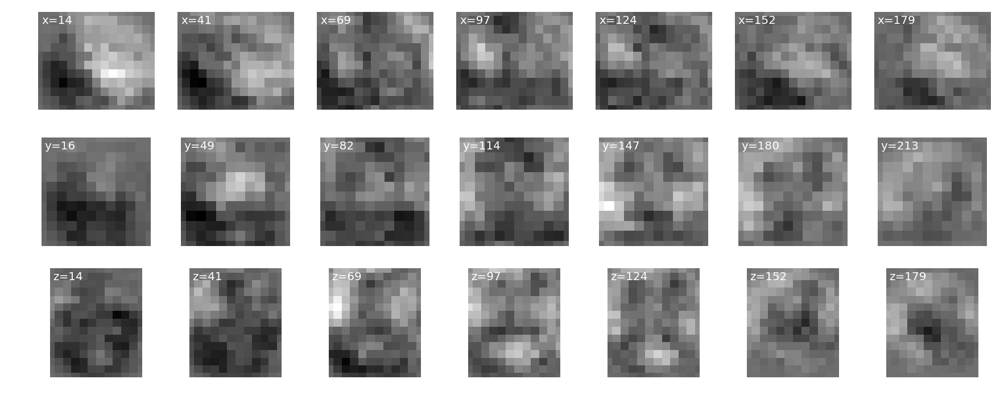

In [95]:
utils.plot_slices(relevance_map_grad_cam)

In [96]:
get_relevance_per_area(relevance_map_grad_cam)[:10]

[(u'Temporal_Mid', 0.054192507360623032),
 (u'Frontal_Mid', 0.051264097405838004),
 (u'Precuneus', 0.042834251459367645),
 (u'Postcentral', 0.041312997666219611),
 (u'Frontal_Sup', 0.038478464694015481),
 (u'Precentral', 0.035601279595778405),
 (u'Temporal_Sup', 0.03417875501081212),
 (u'Occipital_Mid', 0.031648777309559006),
 (u'Temporal_Inf', 0.031331142826383156),
 (u'Frontal_Inf_Tri', 0.03132852505120836)]

# Relevance heatmaps averaged over the dataset
Plot an average relevance map of all Alzheimer and all control patients (in the test set). These are the kind of plots that are included in the paper.

In [103]:
# If None, average over the entire dataset, otherwise pick a number of samples.
num_samples=None

# The background over which to plot the heatmaps.
bg = test_dataset.mean

## Backpropagation

In [101]:
avg_relevance_map_AD_backprop, avg_relevance_map_NC_backprop, avg_relevance_map_all_backprop = interpretation.average_over_dataset(interpretation.sensitivity_analysis, net, test_dataset, num_samples=num_samples, seed=0, show_progress=True, cuda=True)

interpretation.py:64: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  output = F.softmax(output)


A Jupyter Widget

0.0 549.511221515 0.0 0.000503951129504


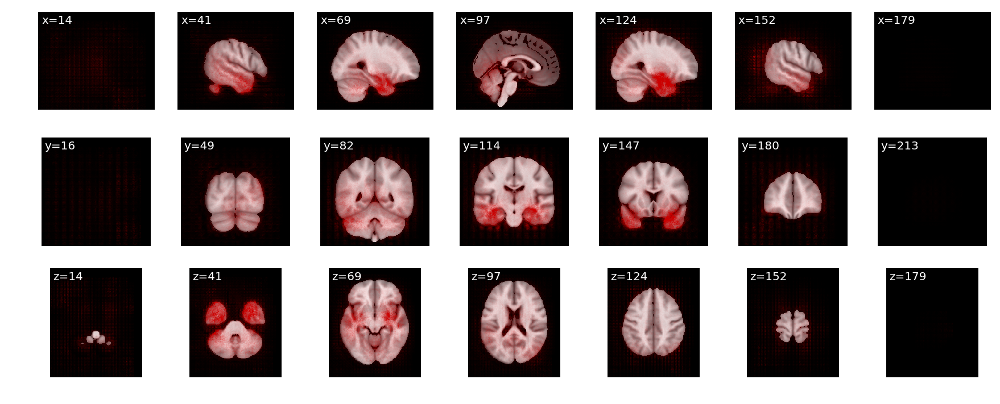

In [104]:
utils.plot_slices(bg, overlay=avg_relevance_map_AD_backprop[0], overlay_vmax=np.percentile(avg_relevance_map_AD_backprop, 99.9))

In [105]:
get_relevance_per_area(avg_relevance_map_AD_backprop)[:10]

[(u'Temporal_Mid', 0.062134743563085661),
 (u'Temporal_Inf', 0.057790990228348202),
 (u'Fusiform', 0.045032374647432045),
 (u'Cerebelum_Crus1', 0.035149581359843862),
 (u'Frontal_Mid', 0.034011630855920828),
 (u'Temporal_Sup', 0.030480898464353673),
 (u'Postcentral', 0.029383138050448038),
 (u'Precuneus', 0.028755629744710007),
 (u'Lingual', 0.028111548429315986),
 (u'Cerebelum_6', 0.027862722562184854)]

0.0 549.511221515 0.0 0.000317961236578


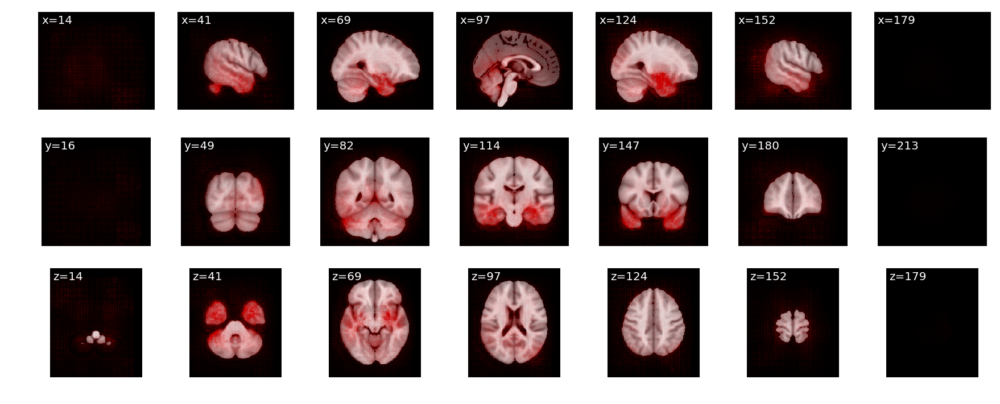

In [108]:
utils.plot_slices(bg, overlay=avg_relevance_map_NC_backprop[0], overlay_vmax=np.percentile(avg_relevance_map_NC_backprop, 99.9))

In [109]:
get_relevance_per_area(avg_relevance_map_NC_backprop)[:10]

[(u'Temporal_Mid', 0.061002153502422413),
 (u'Temporal_Inf', 0.056054593440008793),
 (u'Fusiform', 0.043561413191365285),
 (u'Cerebelum_Crus1', 0.035870638884268641),
 (u'Frontal_Mid', 0.03514580783344981),
 (u'Postcentral', 0.030698061119493421),
 (u'Precuneus', 0.029948179395509297),
 (u'Temporal_Sup', 0.029629998754637767),
 (u'Lingual', 0.028974113765431443),
 (u'Cerebelum_6', 0.027856049680637488)]

0.0 549.511221515 0.0 0.000388720536139


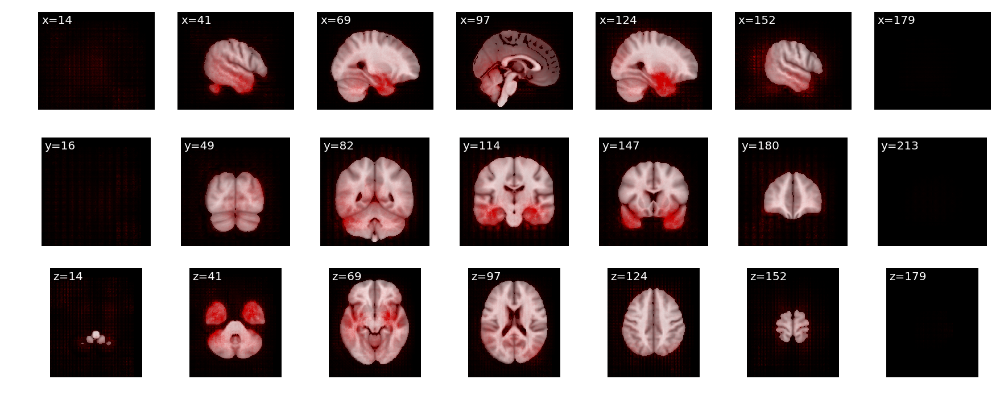

In [110]:
utils.plot_slices(bg, overlay=avg_relevance_map_all_backprop[0], overlay_vmax=np.percentile(avg_relevance_map_all_backprop, 99.9))

In [111]:
get_relevance_per_area(avg_relevance_map_all_backprop)[:10]

[(u'Temporal_Mid', 0.06159187978794492),
 (u'Temporal_Inf', 0.056958678457220933),
 (u'Fusiform', 0.044327287456062292),
 (u'Cerebelum_Crus1', 0.035495192713033877),
 (u'Frontal_Mid', 0.034555281371618826),
 (u'Temporal_Sup', 0.030073030567760273),
 (u'Postcentral', 0.030013423063715915),
 (u'Precuneus', 0.029327259512508308),
 (u'Lingual', 0.028525002948020649),
 (u'Cerebelum_6', 0.027859525859087221)]

## Guided Backpropagation

In [114]:
avg_relevance_map_AD_guided, avg_relevance_map_NC_guided, avg_relevance_map_all_guided = interpretation.average_over_dataset(interpretation.guided_backprop, net, test_dataset, num_samples=num_samples, seed=0, show_progress=True, cuda=True)

A Jupyter Widget

Exception in thread Thread-19:
Traceback (most recent call last):
  File "/home/johannesr/anaconda2/lib/python2.7/threading.py", line 801, in __bootstrap_inner
    self.run()
  File "/home/johannesr/anaconda2/lib/python2.7/site-packages/tqdm/_tqdm.py", line 144, in run
    for instance in self.tqdm_cls._instances:
  File "/home/johannesr/anaconda2/lib/python2.7/_weakrefset.py", line 60, in __iter__
    for itemref in self.data:
RuntimeError: Set changed size during iteration



KeyboardInterrupt: 

0.0 0.999999999767 0.0 6.38190326572e-05


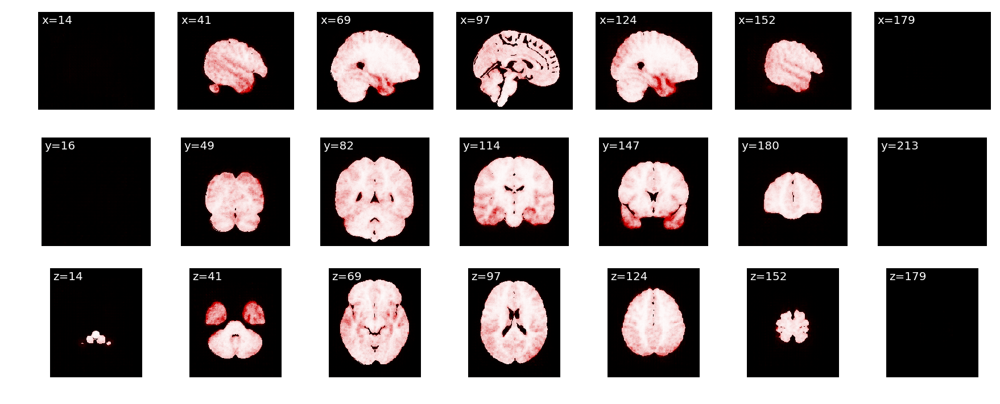

In [44]:
utils.plot_slices(bg, overlay=avg_relevance_map_AD_guided[0], overlay_vmax=np.percentile(avg_relevance_map_AD_guided, 99.9))

In [115]:
get_relevance_per_area(avg_relevance_map_AD_guided)[:10]

[(u'Temporal_Mid', 0.050186747294288528),
 (u'Temporal_Inf', 0.049387297909805415),
 (u'Cerebelum_Crus1', 0.047498072785421633),
 (u'Frontal_Mid', 0.047045323746023951),
 (u'Postcentral', 0.039361640925435266),
 (u'Occipital_Mid', 0.037595296037481275),
 (u'Parietal_Sup', 0.037276696271391033),
 (u'Cerebelum_Crus2', 0.034529242532010909),
 (u'Precentral', 0.033062495184460909),
 (u'Precuneus', 0.031455642043289274)]

0.0 0.999999999767 0.0 8.17471262417e-05


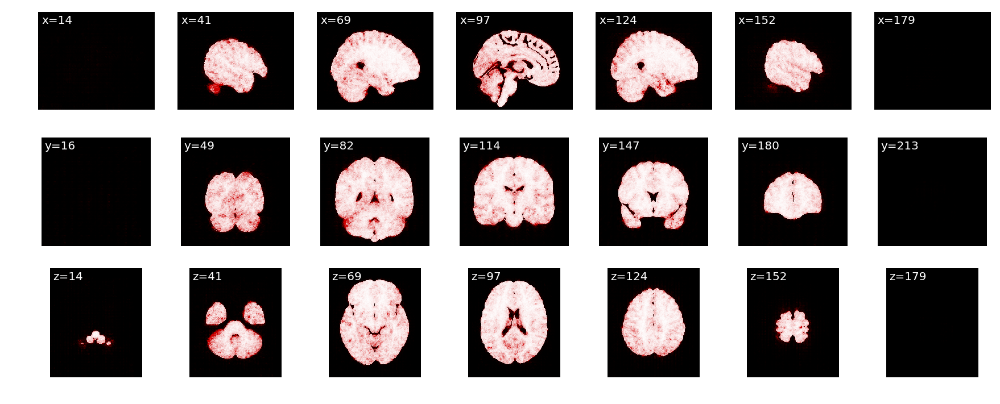

In [159]:
utils.plot_slices(bg, overlay=avg_relevance_map_NC_guided[0], overlay_vmax=np.percentile(avg_relevance_map_NC_guided, 99.9))

In [160]:
get_relevance_per_area(avg_relevance_map_NC_guided)[:10]

[(u'Cerebelum_Crus1', 0.049810027541261681),
 (u'Temporal_Inf', 0.046468558827569076),
 (u'Temporal_Mid', 0.04352493887681675),
 (u'Frontal_Mid', 0.041199888656405614),
 (u'Postcentral', 0.039036988259276616),
 (u'Calcarine', 0.035341691163573982),
 (u'Fusiform', 0.035288182948862094),
 (u'Precuneus', 0.034929902892196232),
 (u'Lingual', 0.032177224202014063),
 (u'Occipital_Mid', 0.031029527596663088)]

0.0 0.999999999767 0.0 7.51947404933e-05


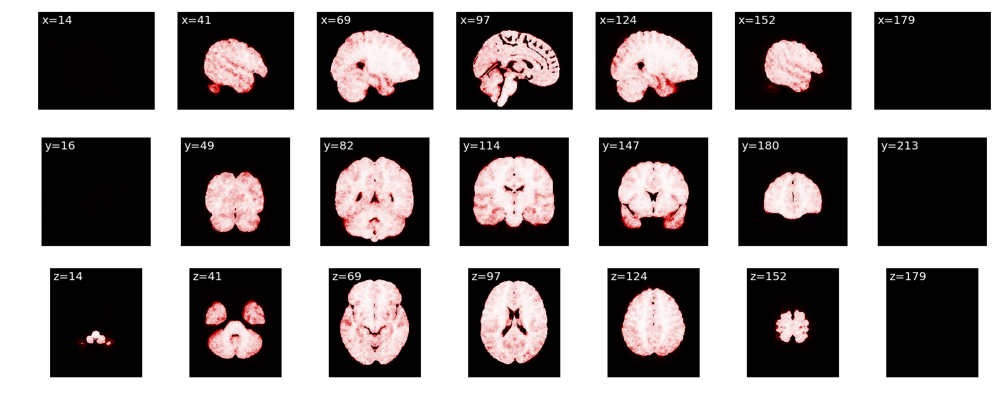

In [161]:
utils.plot_slices(bg, overlay=avg_relevance_map_all_guided[0], overlay_vmax=np.percentile(avg_relevance_map_all_guided, 99.9))

In [162]:
get_relevance_per_area(avg_relevance_map_all_guided)[:10]

[(u'Temporal_Mid', 0.05645940985082927),
 (u'Temporal_Inf', 0.048638344876973133),
 (u'Frontal_Mid', 0.042176584306848841),
 (u'Cerebelum_Crus1', 0.039697114579141671),
 (u'Fusiform', 0.035591344640609257),
 (u'Postcentral', 0.035179118843813875),
 (u'Precuneus', 0.033944449771506333),
 (u'Occipital_Mid', 0.032512787820391291),
 (u'Temporal_Sup', 0.029968466392050856),
 (u'Precentral', 0.028090749363379731)]

## Occlusion

In [115]:
avg_relevance_map_AD_occlusion, avg_relevance_map_NC_occlusion, avg_relevance_map_all_occlusion = interpretation.average_over_dataset(interpretation.occlusion, net, test_dataset, num_samples=num_samples, show_progress=True, size=40, stride=40, cuda=True)

interpretation.py:202: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  output = F.softmax(output)
interpretation.py:264: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  output = F.softmax(output)


A Jupyter Widget

0.0 549.511221515 9.41125970138e-09 0.0739300968616


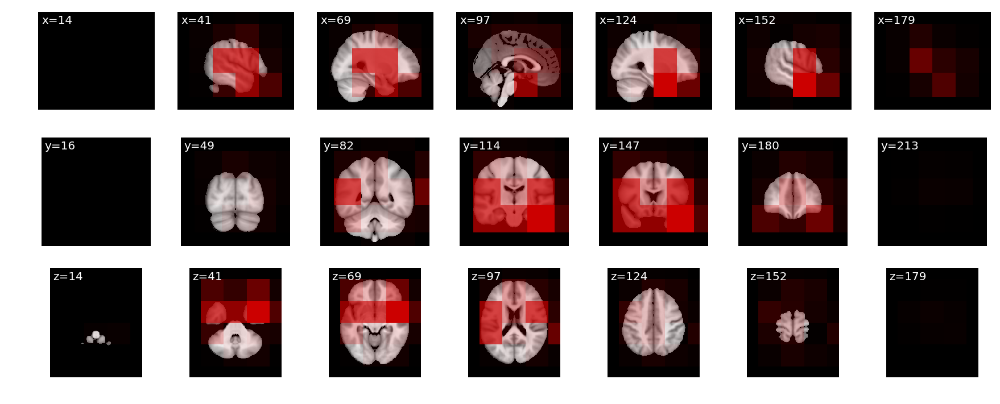

In [116]:
utils.plot_slices(bg, overlay=avg_relevance_map_AD_occlusion, overlay_cmap=utils.alpha_to_red_cmap)

In [117]:
get_relevance_per_area(avg_relevance_map_AD_occlusion)[:10]

[(u'Temporal_Mid', 0.072957060028270862),
 (u'Temporal_Sup', 0.053886007993237062),
 (u'Temporal_Inf', 0.052048787007211217),
 (u'Insula', 0.049190853507404743),
 (u'Postcentral', 0.040979579413481418),
 (u'Temporal_Pole_Sup', 0.040780073290288127),
 (u'Precentral', 0.040048014258702358),
 (u'Frontal_Mid', 0.036851133077837384),
 (u'Frontal_Inf_Orb', 0.034153846664753303),
 (u'Frontal_Inf_Oper', 0.033197889095795095)]

0.0 549.511221515 9.63307390309e-09 0.0367510451211


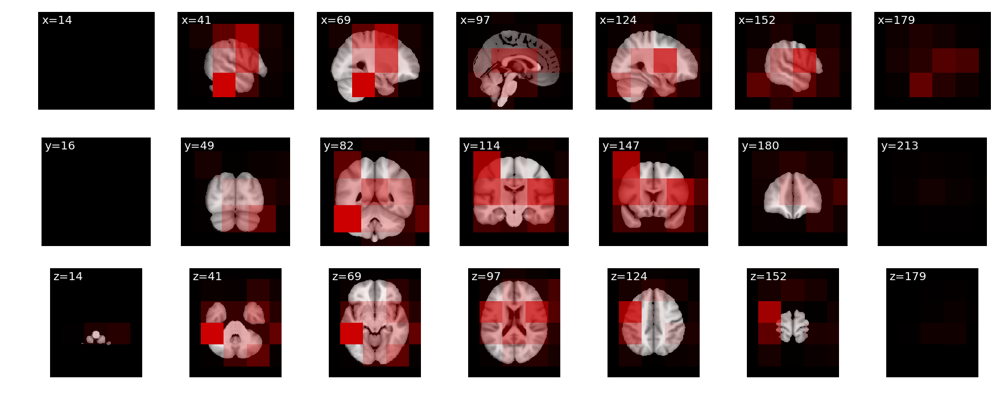

In [118]:
utils.plot_slices(bg, overlay=avg_relevance_map_NC_occlusion, overlay_cmap=utils.alpha_to_red_cmap)

In [119]:
get_relevance_per_area(avg_relevance_map_NC_occlusion)[:10]

[(u'Temporal_Inf', 0.061021806978649409),
 (u'Temporal_Mid', 0.05769021858717456),
 (u'Precentral', 0.052548755838425415),
 (u'Postcentral', 0.051881350489086188),
 (u'Frontal_Mid', 0.043890230859154139),
 (u'Temporal_Sup', 0.039730211935695994),
 (u'Fusiform', 0.039136553061625542),
 (u'Insula', 0.036014859667420178),
 (u'Cerebelum_Crus1', 0.034843020184713691),
 (u'Frontal_Inf_Oper', 0.029754418467212863)]

0.0 549.511221515 9.53674316406e-09 0.0409704976422


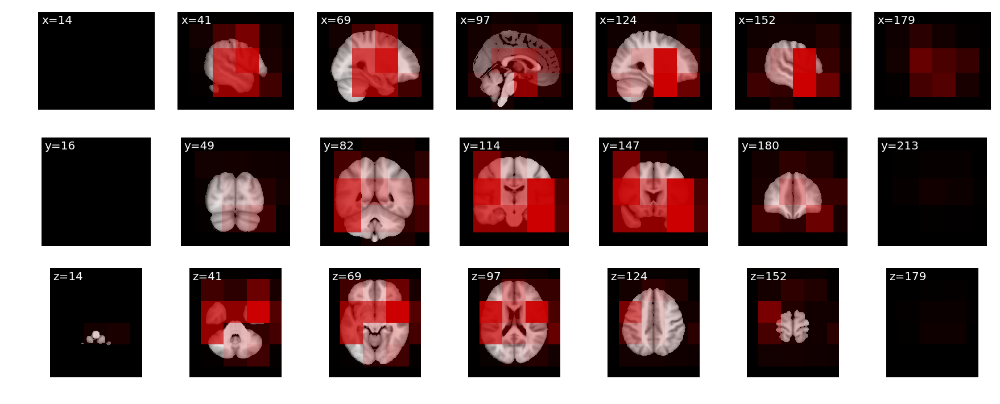

In [120]:
utils.plot_slices(bg, overlay=avg_relevance_map_all_occlusion, overlay_cmap=utils.alpha_to_red_cmap)

In [121]:
get_relevance_per_area(avg_relevance_map_all_occlusion)[:10]

[(u'Temporal_Mid', 0.066681564258594159),
 (u'Temporal_Inf', 0.055737182481104444),
 (u'Temporal_Sup', 0.048067211838298637),
 (u'Postcentral', 0.045460795684109628),
 (u'Precentral', 0.045186493701490152),
 (u'Insula', 0.043774808942906265),
 (u'Frontal_Mid', 0.039744582159589446),
 (u'Fusiform', 0.032434302436200386),
 (u'Frontal_Inf_Oper', 0.031782436826506173),
 (u'Temporal_Pole_Sup', 0.031356395668652545)]

## Area Occlusion

In [129]:
avg_relevance_map_AD_area_occlusion, avg_relevance_map_NC_area_occlusion, avg_relevance_map_all_area_occlusion = interpretation.average_over_dataset(interpretation.area_occlusion, net, test_dataset, num_samples=num_samples, seed=0, show_progress=True, cuda=True, area_masks=area_masks)

interpretation.py:332: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  output = F.softmax(output)
interpretation.py:361: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  output = F.sigmoid(output)


A Jupyter Widget

0.0 549.511221515 0.0 0.110895


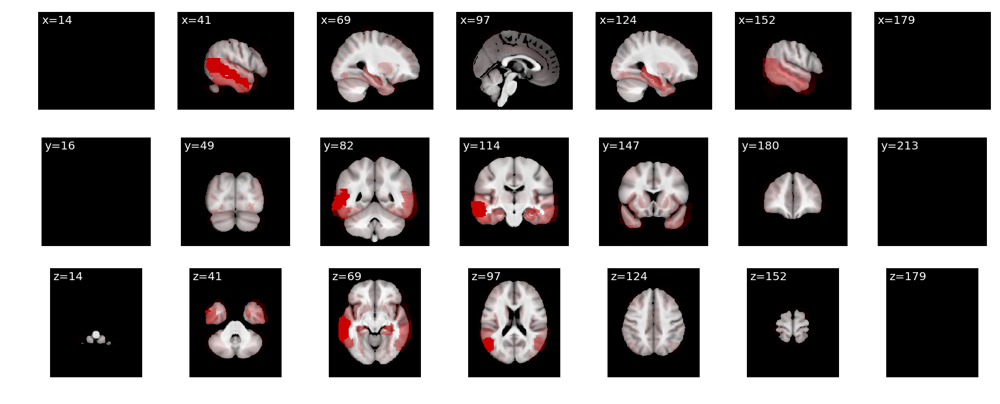

In [130]:
utils.plot_slices(bg, overlay=avg_relevance_map_AD_area_occlusion, overlay_cmap=utils.alpha_to_red_cmap)

In [131]:
get_relevance_per_area(avg_relevance_map_AD_area_occlusion)[:10]

[(u'Temporal_Mid', 0.29899228606591921),
 (u'Temporal_Inf', 0.12873758429466486),
 (u'Temporal_Sup', 0.055523030824349881),
 (u'Fusiform', 0.047355127516851739),
 (u'Hippocampus', 0.039051431720235973),
 (u'Insula', 0.034223421137851387),
 (u'Frontal_Mid', 0.033204438981797278),
 (u'ParaHippocampal', 0.032341461009729497),
 (u'Occipital_Mid', 0.021591229151608399),
 (u'Postcentral', 0.020695415910984304)]

0.0 549.511221515 0.0 0.0882691


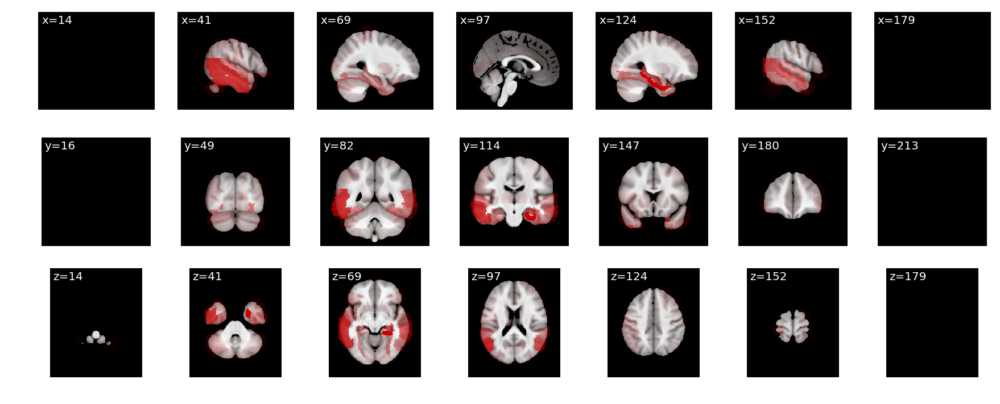

In [132]:
utils.plot_slices(bg, overlay=avg_relevance_map_NC_area_occlusion)

In [133]:
get_relevance_per_area(avg_relevance_map_NC_area_occlusion)[:10]

[(u'Temporal_Mid', 0.23951053005236414),
 (u'Temporal_Inf', 0.13724089443307996),
 (u'Fusiform', 0.07518205198029479),
 (u'Temporal_Sup', 0.070769070759252262),
 (u'ParaHippocampal', 0.055645940275874196),
 (u'Hippocampus', 0.03238929802741166),
 (u'Postcentral', 0.032303379687998679),
 (u'Cerebelum_Crus1', 0.032146491235223187),
 (u'Occipital_Mid', 0.023138422637734978),
 (u'Frontal_Inf_Orb', 0.020716323959658826)]

0.0 549.511221515 0.0 0.084879


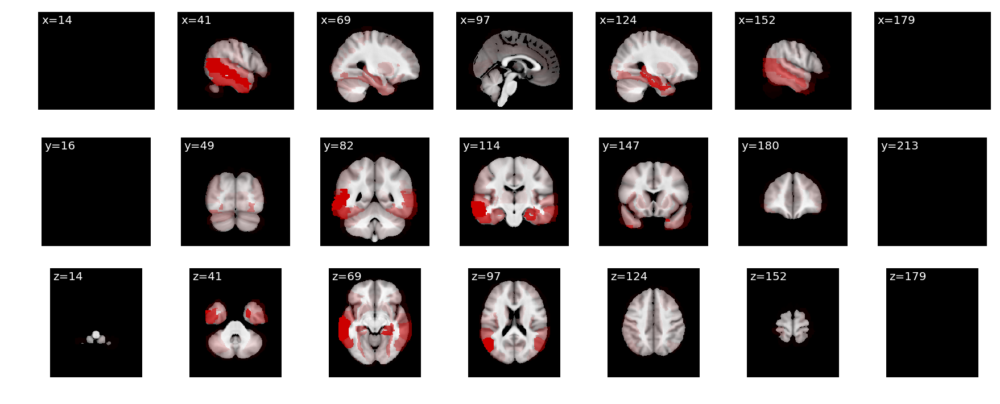

In [135]:
utils.plot_slices(bg, overlay=avg_relevance_map_all_area_occlusion)

In [136]:
get_relevance_per_area(avg_relevance_map_all_area_occlusion)[:10]

[(u'Temporal_Mid', 0.26719152370882809),
 (u'Temporal_Inf', 0.13328373504162205),
 (u'Temporal_Sup', 0.063674012880801822),
 (u'Fusiform', 0.062232245527397992),
 (u'ParaHippocampal', 0.044800748854860295),
 (u'Hippocampus', 0.035489654638210077),
 (u'Postcentral', 0.026901384470372595),
 (u'Frontal_Mid', 0.026513606921130348),
 (u'Insula', 0.025595892485903934),
 (u'Cerebelum_Crus1', 0.025407134798663376)]

## Grad-CAM

In [177]:
avg_relevance_map_AD_grad_cam, avg_relevance_map_NC_grad_cam, avg_relevance_map_all_grad_cam = average_over_dataset(grad_cam, net, val_dataset, num_samples=10, show_progress=True, resize=True, interpolation=0, cuda=True)

Stored feature maps

 0  1
[torch.cuda.FloatTensor of size 1x2 (GPU 0)]

Stored gradient
-7.29961e-06 7.08103e-07 4.99927e-06
(64, 1, 1, 1)
(64, 12, 15, 12)


/home/johannesr/anaconda2/lib/python2.7/site-packages/ipykernel_launcher.py:52: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.


(193, 229, 193)
-0.00616041280356 0.00234264996183 0.0206248799419
0.0 0.00234271662625 0.0206248799419


A Jupyter Widget

Stored feature maps

 0  1
[torch.cuda.FloatTensor of size 1x2 (GPU 0)]

Stored gradient
-0.000133532 1.04765e-06 6.13846e-05
(64, 1, 1, 1)
(64, 12, 15, 12)
(193, 229, 193)
0.0 0.0325809875812 0.288145088374
0.0 0.0325809875812 0.288145088374
Stored feature maps

 0  1
[torch.cuda.FloatTensor of size 1x2 (GPU 0)]

Stored gradient
-2.66748e-06 1.86013e-07 2.00374e-06
(64, 1, 1, 1)
(64, 12, 15, 12)
(193, 229, 193)
0.0 0.00144478668993 0.0110070428038
0.0 0.00144478668993 0.0110070428038
Stored feature maps

 1  0
[torch.cuda.FloatTensor of size 1x2 (GPU 0)]

Stored gradient
-2.23378e-05 -1.98326e-07 4.58244e-05
(64, 1, 1, 1)
(64, 12, 15, 12)
(193, 229, 193)
-0.168327440861 -0.018916657988 0.0
0.0 0.0 0.0
Stored feature maps

 0  1
[torch.cuda.FloatTensor of size 1x2 (GPU 0)]

Stored gradient
-0.000136879 1.29542e-06 6.29233e-05
(64, 1, 1, 1)
(64, 12, 15, 12)
(193, 229, 193)
0.0 0.0352667925852 0.308656365672
0.0 0.0352667925852 0.308656365672
Stored feature maps

 0  1
[torch.cuda.FloatT

0.0 0.999999999767 0.0 0.134745242323


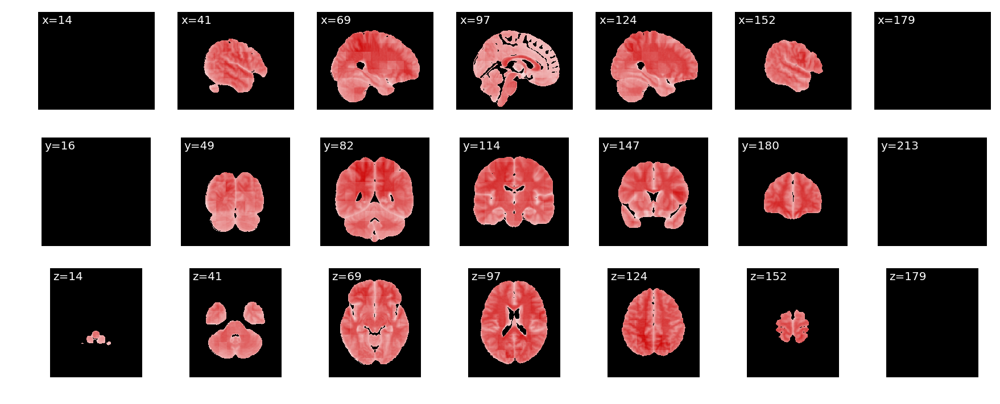

In [178]:
utils.plot_slices(mask, overlay=avg_relevance_map_AD_grad_cam)

In [175]:
get_relevance_per_area(avg_relevance_map_AD_grad_cam)[:10]

[(u'Temporal_Mid', 0.053845750907240607),
 (u'Frontal_Mid', 0.051623428906219217),
 (u'Postcentral', 0.043679972671047063),
 (u'Precuneus', 0.041486119280426274),
 (u'Frontal_Sup', 0.039713422634043746),
 (u'Precentral', 0.036692126616376955),
 (u'Temporal_Inf', 0.03594565352913888),
 (u'Temporal_Sup', 0.034491256663484134),
 (u'Frontal_Sup_Medial', 0.029751588966791989),
 (u'Occipital_Mid', 0.026891049705499784)]

0.0 0.999999999767 7.52873e-06 2.74527e-05


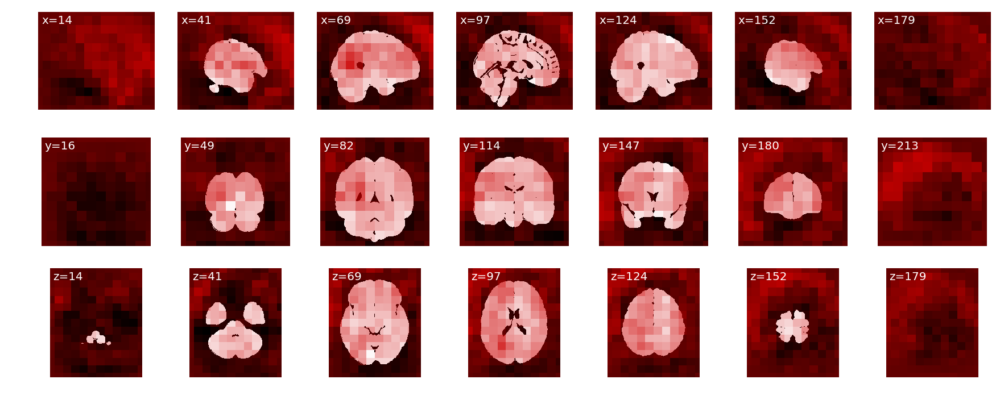

In [176]:
utils.plot_slices(mask, overlay=avg_relevance_map_NC_grad_cam)

In [177]:
get_relevance_per_area(avg_relevance_map_NC_grad_cam)[:10]

[(u'Frontal_Mid', 0.057748499972342993),
 (u'Temporal_Mid', 0.051484408548191994),
 (u'Postcentral', 0.043746887049028849),
 (u'Frontal_Sup', 0.040697493868025555),
 (u'Precentral', 0.038462257428286642),
 (u'Precuneus', 0.036440126900865538),
 (u'Occipital_Mid', 0.032445582227252759),
 (u'Temporal_Sup', 0.031684322836870824),
 (u'Frontal_Sup_Medial', 0.031069389171376614),
 (u'Temporal_Inf', 0.030325395340027463)]

0.0 0.999999999767 2.09487e-05 6.54557e-05


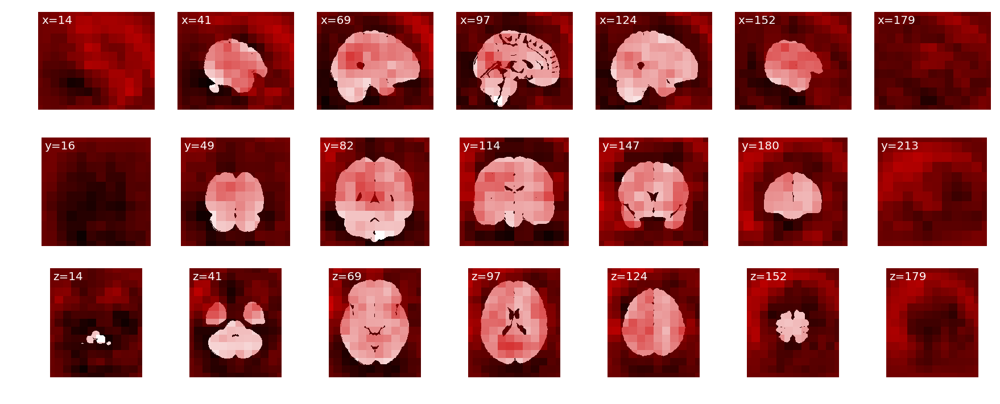

In [178]:
utils.plot_slices(mask, overlay=avg_relevance_map_all_grad_cam)

In [332]:
get_relevance_per_area(avg_relevance_map_all_grad_cam)[:10]

[(u'Temporal_Mid', 0.060387850835372001),
 (u'Temporal_Inf', 0.04414113086144425),
 (u'Postcentral', 0.040293789313904108),
 (u'Fusiform', 0.039073868188720974),
 (u'Temporal_Sup', 0.036716222566414138),
 (u'Precentral', 0.035485165563436574),
 (u'Cerebelum_Crus1', 0.0339850333754141),
 (u'Lingual', 0.031589250600262589),
 (u'Precuneus', 0.031394621366576433),
 (u'Cerebelum_6', 0.027076479595789703)]

## Save average heatmaps

In [ ]:
# Save heatmaps to file.
#np.savez('relevance_maps_final.npz', **{
#    'avg_relevance_map_AD_backprop': avg_relevance_map_AD_backprop, 
#    'avg_relevance_map_AD_guided': avg_relevance_map_AD_guided,
#    'avg_relevance_map_AD_occlusion': avg_relevance_map_AD_occlusion,
#    'avg_relevance_map_AD_area_occlusion': avg_relevance_map_AD_area_occlusion,
#    'avg_relevance_map_AD_grad_cam': avg_relevance_map_AD_grad_cam,
    
#    'avg_relevance_map_NC_backprop': avg_relevance_map_NC_backprop, 
#    'avg_relevance_map_NC_guided': avg_relevance_map_NC_guided,
#    'avg_relevance_map_NC_occlusion': avg_relevance_map_NC_occlusion,
#    'avg_relevance_map_NC_area_occlusion': avg_relevance_map_NC_area_occlusion,
#    'avg_relevance_map_NC_grad_cam': avg_relevance_map_NC_grad_cam
#})

# Figures and tables for paper

In [15]:
# Load heatmaps from file.
loaded_heatmaps = np.load('relevance_maps_final.npz')
avg_relevance_map_AD_backprop = loaded_heatmaps['avg_relevance_map_AD_backprop']
avg_relevance_map_AD_guided = loaded_heatmaps['avg_relevance_map_AD_guided']
avg_relevance_map_AD_occlusion = loaded_heatmaps['avg_relevance_map_AD_occlusion']
avg_relevance_map_AD_area_occlusion = loaded_heatmaps['avg_relevance_map_AD_area_occlusion']
avg_relevance_map_AD_grad_cam = loaded_heatmaps['avg_relevance_map_AD_grad_cam']
avg_relevance_map_NC_backprop = loaded_heatmaps['avg_relevance_map_NC_backprop']
avg_relevance_map_NC_guided = loaded_heatmaps['avg_relevance_map_NC_guided']
avg_relevance_map_NC_occlusion = loaded_heatmaps['avg_relevance_map_NC_occlusion']
avg_relevance_map_NC_area_occlusion = loaded_heatmaps['avg_relevance_map_NC_area_occlusion']
avg_relevance_map_NC_grad_cam = loaded_heatmaps['avg_relevance_map_NC_grad_cam']

## Figure 1 (Average heatmaps)

In [16]:
def plot_column(struct_arr, axes, title, cmap='gray', vmin=None, vmax=None, overlay=None, overlay_cmap=utils.alpha_to_red_cmap, overlay_vmin=None, overlay_vmax=None):
    if vmin is None:
        vmin = struct_arr.min()
    if vmax is None:
        vmax = struct_arr.max()
    if overlay_vmin is None and overlay is not None:
        overlay_vmin = overlay.min()
    if overlay_vmax is None and overlay is not None:
        overlay_vmax = overlay.max()
    print(vmin, vmax, overlay_vmin, overlay_vmax)
    
    offset = 80
    num_slices = len(axes)
    
    intervals = (np.asarray(struct_arr.shape) - 2 * offset) / (num_slices - 1)
    
    axis = 1
    axis_label = 'y'
    
    #for axes_column in zip(titles):
        
    for i, ax in enumerate(axes):
        #print(axis_label, 'plotting slice', i_slice)
        i_slice = int(np.round(offset + i * intervals[axis]))

        plt.sca(ax)
        ax.get_xaxis().set_ticks([])
        ax.get_yaxis().set_ticks([])
        #plt.axis('off')
        plt.imshow(sp.ndimage.rotate(np.take(struct_arr, i_slice, axis=axis), 90), vmin=vmin, vmax=vmax, 
                   cmap=cmap, interpolation=None)
        plt.text(0.03, 0.97, '{}'.format(i_slice), color='white', 
                 horizontalalignment='left', verticalalignment='top', transform=ax.transAxes)

        if overlay is not None:
            plt.imshow(sp.ndimage.rotate(np.take(overlay, i_slice, axis=axis), 90), cmap=overlay_cmap, 
                       vmin=overlay_vmin, vmax=overlay_vmax, interpolation=None)

        if i == 0:
            plt.title(title + '\n')
            #plt.ylabel('Backpropagation', rotation=0, size='large')
            #ax.get_yaxis().set_label_coords(-0.5, 0.5)

0.0 550 0.0 0.000433554163901
0.0 550 0.0 5.59905382397e-05
0.0 550 9.03100678415e-09 0.0754356402339
0.0 550 0.0 0.0471957


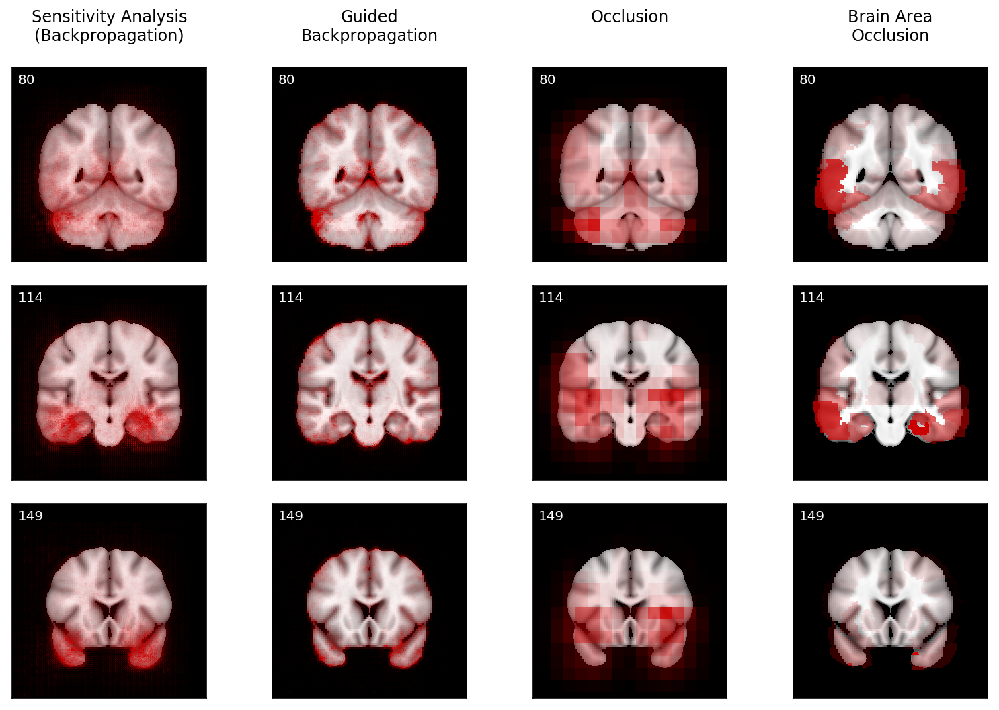

In [17]:
fig, axes = plt.subplots(3, 4, figsize=(11, 7.5))
axes = axes.T

#bg = mask
bg = test_dataset.mean
vmax = 550  # make the background brain a bit lighter

plot_column(bg, axes[0], 'Sensitivity Analysis\n(Backpropagation)', overlay=avg_relevance_map_NC_backprop[0], overlay_vmax=np.percentile(avg_relevance_map_NC_backprop, 99.9), vmax=vmax)
plot_column(bg, axes[1], 'Guided\nBackpropagation', overlay=avg_relevance_map_NC_guided[0], overlay_vmax=np.percentile(avg_relevance_map_NC_guided, 99.9), vmax=vmax)
plot_column(bg, axes[2], 'Occlusion\n', overlay=avg_relevance_map_NC_occlusion, vmax=vmax)
plot_column(bg, axes[3], 'Brain Area\nOcclusion', overlay=avg_relevance_map_NC_area_occlusion, vmax=vmax)
#plot_column(bg, axes[4], 'Grad-CAM\n', overlay=avg_relevance_map_AD_grad_cam, vmax=vmax)
plt.tight_layout()

#plt.savefig('heatmaps-nc.png', dpi=300)

## Table 1 (Most relevant brain areas)

In [18]:
most_relevant_areas_per_method = [
    get_relevance_per_area(avg_relevance_map_AD_backprop)[:4],
    get_relevance_per_area(avg_relevance_map_AD_guided)[:4],
    get_relevance_per_area(avg_relevance_map_AD_occlusion)[:4],
    get_relevance_per_area(avg_relevance_map_AD_area_occlusion)[:4]#,
    #get_relevance_per_area(avg_relevance_map_AD_grad_cam)[:4]
]

In [19]:
lines = []
for i in range(len(most_relevant_areas_per_method[0])):
    line = ' & '.join(['{} ({:.1f} \\%)'.format(areas[i][0].replace('_', ''), areas[i][1]*100) for areas in most_relevant_areas_per_method])
    lines.append(line)
print(' \\\\ \n'.join(lines))  # output in latex format

TemporalMid (6.1 \%) & TemporalMid (7.0 \%) & TemporalMid (12.1 \%) & TemporalMid (29.7 \%) \\ 
TemporalInf (5.9 \%) & TemporalInf (5.7 \%) & TemporalInf (9.2 \%) & TemporalInf (14.8 \%) \\ 
Fusiform (4.6 \%) & FrontalMid (4.2 \%) & Fusiform (6.2 \%) & TemporalSup (4.4 \%) \\ 
CerebelumCrus1 (3.8 \%) & Fusiform (3.9 \%) & ParaHippocampal (5.4 \%) & Hippocampus (4.1 \%)


## Table 2 (Euclidean distances between heatmaps)

In [20]:
relevance_maps_AD = [avg_relevance_map_AD_backprop, avg_relevance_map_AD_guided, avg_relevance_map_AD_occlusion, avg_relevance_map_AD_area_occlusion]
relevance_maps_NC = [avg_relevance_map_NC_backprop, avg_relevance_map_NC_guided, avg_relevance_map_NC_occlusion, avg_relevance_map_NC_area_occlusion]
names = ['backprop ', 'guided   ', 'occlusion', 'area occl']

In [23]:
scale_factor = 1e-4

print('Euclidean distance between average heatmaps for AD / NC samples in {}'.format(scale_factor))
print()

print('\t\t' + '\t'.join(names))

for a_AD, a_NC, a_name in zip(relevance_maps_AD, relevance_maps_NC, names):
    print(a_name, end='\t')
    for b_AD, b_NC, b_name in zip(relevance_maps_AD, relevance_maps_NC, names):
        print('{:.2f} / {:.2f}'.format(interpretation.heatmap_distance(a_AD, b_AD) / scale_factor, interpretation.heatmap_distance(a_NC, b_NC) / scale_factor), end='\t')
    print()

Euclidean distance between average heatmaps for AD / NC samples in 0.0001

		backprop 	guided   	occlusion	area occl
backprop 	0.00 / 0.00	4.09 / 4.36	5.15 / 4.09	11.48 / 9.04	
guided   	4.09 / 4.36	0.00 / 0.00	6.47 / 5.83	11.36 / 9.80	
occlusion	5.15 / 4.09	6.47 / 5.83	0.00 / 0.00	11.16 / 9.66	
area occl	11.48 / 9.04	11.36 / 9.80	11.16 / 9.66	0.00 / 0.00	


In [24]:
print('Euclidean distance between AD and NC heatmaps for each method in {}'.format(scale_factor))
print()

print('\t'.join(names))
for a, b in zip(relevance_maps_AD, relevance_maps_NC):
    print('{:.2f}'.format(interpretation.heatmap_distance(a, b) / scale_factor), end='\t\t')

Euclidean distance between AD and NC heatmaps for each method in 0.0001

backprop 	guided   	occlusion	area occl
1.26		3.85		5.98		5.54		

# Export to Animation and MRIcron

In [42]:
anim = utils.animate_slices(test_dataset.mean, overlay=avg_relevance_map_AD_guided[0], overlay_vmax=np.percentile(avg_relevance_map_AD_guided, 99.9), axis=2, reverse_direction=True, interval=70)
plt.close()  # suppress plot output

In [43]:
plt.rcParams['animation.ffmpeg_path'] = u'/home/johannesr/ffmpeg-3.4.1-64bit-static/ffmpeg'    

In [44]:
# Display the animation inline.
from IPython.display import HTML
HTML(anim.to_html5_video())

In [45]:
anim.save('data/anim-guided.gif')

ValueError: I/O operation on closed file

In [ ]:
# You can also save the relevance map in NIFTI format and load it as an overlay in MRIcron (https://www.nitrc.org/projects/mricron) later.
#utils.save_nifti('guided_backprop.nii', relevance_map_guided[0])